Link of the Dataset : https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection

## Import packages


In [1]:
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import glob
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score
import cv2  
import sys

## Reading the Images

In [2]:
tumor = []
healthy = []

#to loop through the tumor images using glob and cv2 to read in an image
for file in glob.iglob('./brain_tumor_dataset/yes/*.jpg'):
    img = cv2.imread(file)
    # fix the dimensions of images -> to get consistent dataset
    img = cv2.resize(img, (128,128)) 
    # organise and order, split into individual channels
    b, g, r = cv2.split(img)
    img = cv2.merge([r, g, b])
    tumor.append(img)

for file in glob.iglob('./brain_tumor_dataset/no/*.jpg'):
    img = cv2.imread(file)
    img = cv2.resize(img, (128,128)) 
    b, g, r = cv2.split(img)
    img = cv2.merge([r, g, b])
    healthy.append(img)

In [3]:
# convert the lists into numpy arrays
healthy = np.array(healthy)
tumor = np.array(tumor)

# concatenate both arrays
ALL = np.concatenate((healthy, tumor))

In [4]:
ALL.shape

(251, 128, 128, 3)

# Visualizing Brain MRI Images

In [5]:
def plot_random(healthy, tumor, num=5):
    # 5 random images from index 0 to 97(length), healthy.shape = (97, 128, 128, 3)
    healthy_imgs = healthy[np.random.choice(healthy.shape[0], num, replace=False)]
    tumor_imgs = tumor[np.random.choice(tumor.shape[0], num, replace=False)]
    
    plt.figure(figsize=(16,9))
    for i in range(num):
        plt.subplot(1, num, i+1)  #plt index starts from 1 not 0
        plt.title("healthy")
        plt.imshow(healthy_imgs[i])
        
    plt.figure(figsize=(16,9))
    for i in range(num):
        plt.subplot(1, num, i+1) 
        plt.title("tumor")
        plt.imshow(tumor_imgs[i])

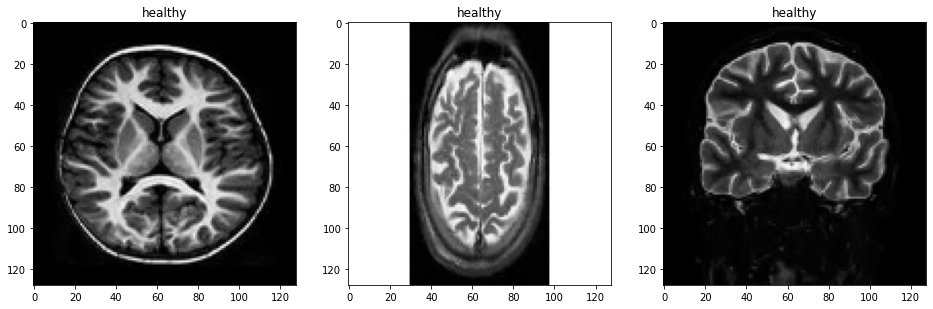

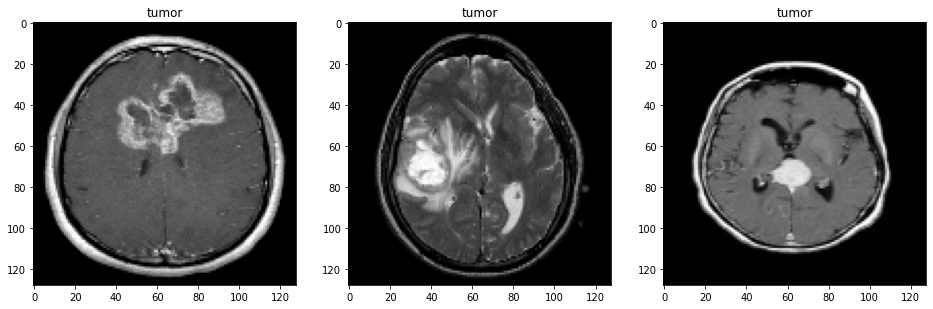

In [6]:
plot_random(healthy, tumor, 3)

 # Create Torch Dataset Class

In [7]:
class Dataset(object):
    """ An Abstract class representing a Dataset.
    
        All other datasets should subclass it and override __len___, that
        provides the size of the data set, and __getitem__ supporting integer
        indexing in range from 0 s to len(self) exclusive """
    
    def __getitem__(self, index):
        raise NotImplementedError 
    
    def __len__(self):
        raise NotImplementedError
        
    def __add__(self, other):
        return ConcatDataset([self, other])
        

In [8]:
class MRI(Dataset):
    def __init__(self):
        
        tumor = []
        healthy = []

        #to loop through the tumor images using glob and cv2 to read in an image
        for file in glob.iglob('./brain_tumor_dataset/yes/*.jpg'):
            img = cv2.imread(file)
            # fix the dimensions of images -> to get consistent dataset
            img = cv2.resize(img, (128,128)) 
            # organise and order, split into individual channels
            b, g, r = cv2.split(img)
            img = cv2.merge([r, g, b])
            img = img.reshape((img.shape[2], img.shape[1], img.shape[0]))
            tumor.append(img)

        for file in glob.iglob('./brain_tumor_dataset/no/*.jpg'):
            img = cv2.imread(file)
            img = cv2.resize(img, (128,128)) 
            b, g, r = cv2.split(img)
            img = cv2.merge([r, g, b])
            img = img.reshape((img.shape[2], img.shape[1], img.shape[0]))
            healthy.append(img)
        
        # convert the lists into numpy arrays
        # Images
        healthy = np.array(healthy)
        tumor = np.array(tumor)
        
        # Labels 
        tumor_label = np.ones(tumor.shape[0], dtype=np.float32)     # Return a new array of given shape and type, filled with ones.
        healthy_label = np.zeros(healthy.shape[0], dtype=np.float32)
        
        #Concatenates , ALL
        self.images = np.concatenate((tumor, healthy), axis=0) #(97, 128, 128, 3) + (154, 128, 128, 3) = (97+154, 128, 128, 3)
        self.labels = np.concatenate((tumor_label, healthy_label)) 
        
    # we have to override the method to get access of a particular index in the dataset cant just access with mri_object[index] without it.
    def __getitem__(self, index):
        return {'Image':self.images[index], 'Label': self.labels[index]}
    
    def __len__(self):
        return self.images.shape[0]
    
    # 
    def normalise(self):
        self.images = self.images/255.0
        


In [9]:
mri = MRI()

# Creating a Dataloader

In [10]:
dataloader = DataLoader(mri, shuffle=True)
# shuffling is one of the advantages and reasons of why to use a DataLoader
# batch size is the number of items to load

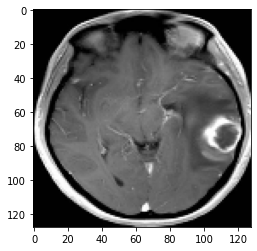

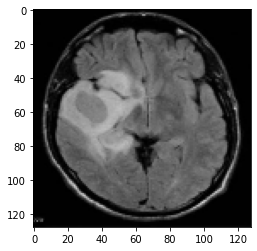

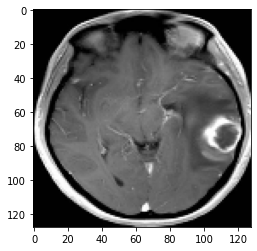

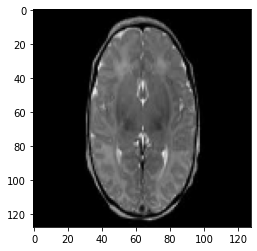

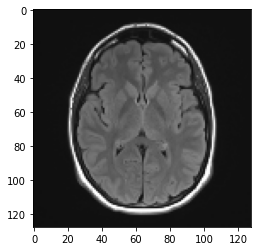

...

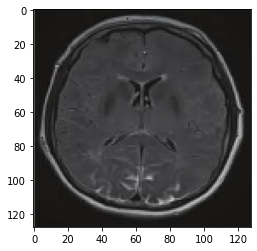

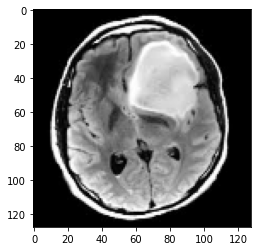

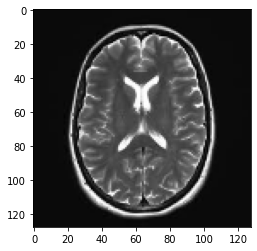

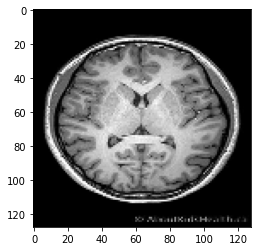

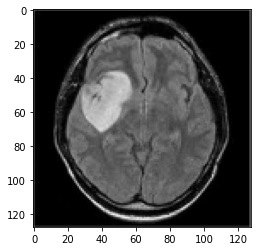

In [11]:
for sample in dataloader:
    img = sample['Image'].squeeze()
    img = img.reshape((img.shape[1], img.shape[2], img.shape[0]))
    plt.imshow(img)
    plt.show()


# Create a Model

In [12]:
import torch.nn as nn
import torch.nn.functional as F

# Neural Networks are defined as a class that inherits from nn.Module
class CNN(nn.Module):
    def __init__(self):
        # it has the ability to turn all the learnable parameters in our Neural Network into Parameter Objects.
        #and those are the ones that Pytorch keeps track of and keeps updating them during the training process
        # nn.conv2d() is a class in the nn module used to create a 2-dimensional convolutional layer for processing 2D input tensors, typically used in image processing tasks within convolutional neural networks (CNNs).
        super(CNN,self).__init__()
        # 3inputs RGB, 6 filters, Tanh for non Linearity, AvgPooling for the window of a kernel_size that keeps sliding across the input data with a jump(stride)of 5 each time and averaging all the elements that are overlapping in that window
        # the output of the first conv layer is the input to the second
        self.cnn_model = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5),
        nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5))
        
        #fully connected Model
        self.fc_model = nn.Sequential(
        nn.Linear(in_features=256, out_features=120),
        nn.Tanh(),
        nn.Linear(in_features=120, out_features=84),
        nn.Tanh(),
        nn.Linear(in_features=84, out_features=1))
        
        
    def forward(self, x):
        x = self.cnn_model(x)
        x = x.view(x.size(0), -1) # flattens the 2d arrays
        x = self.fc_model(x)
        x = F.sigmoid(x)# maps input values to a value between 0 and 1 -> b< which it determines if it has a tumor or not
        
        return x
    

### Understanding the img.view(img.size(0, -1))

In [13]:
x = torch.tensor([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16])

In [14]:
x = x.reshape((2,2,2,2))

In [15]:
x

tensor([[[[ 1,  2],
          [ 3,  4]],

         [[ 5,  6],
          [ 7,  8]]],


        [[[ 9, 10],
          [11, 12]],

         [[13, 14],
          [15, 16]]]])

In [16]:
x.size(0)

2

In [17]:
# our input data has actually only three dimension (128,128,3)
#the 4.th dimension here has nothing to do with the img itself
#but rather with the fact that we pass our images in ---batches--
#not one by one to the Neural Network
#e.g. (32,128,128,3) so 32 images at a time

In [18]:
x.view(-1) # we dont want this!
#we want to flatten each input data seperately !

tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])

In [19]:
x.view(x.size(0), -1)

tensor([[ 1,  2,  3,  4,  5,  6,  7,  8],
        [ 9, 10, 11, 12, 13, 14, 15, 16]])

## model.train()

. Brings drop out and batch norm to action(i.e. train mode)

. Gradients are computed

In [20]:
# device will be 'cuda' if a GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# creating a CPU tensor
cpu_tensor = torch.rand(10).to(device)
# moving same tensor to GPU
gpu_tensor = cpu_tensor.to(device)

print(cpu_tensor, cpu_tensor.dtype, type(cpu_tensor), cpu_tensor.type())
print(gpu_tensor, gpu_tensor.dtype, type(gpu_tensor), gpu_tensor.type())

print(cpu_tensor*gpu_tensor)

tensor([0.2753, 0.2102, 0.7545, 0.5145, 0.7579, 0.6942, 0.4767, 0.9569, 0.0367,
        0.7599]) torch.float32 <class 'torch.Tensor'> torch.FloatTensor
tensor([0.2753, 0.2102, 0.7545, 0.5145, 0.7579, 0.6942, 0.4767, 0.9569, 0.0367,
        0.7599]) torch.float32 <class 'torch.Tensor'> torch.FloatTensor
tensor([0.0758, 0.0442, 0.5692, 0.2647, 0.5743, 0.4820, 0.2272, 0.9157, 0.0013,
        0.5775])


# Evaluate a new-born Neural Network!

In [21]:
mri_dataset = MRI()
mri_dataset.normalise()
model = CNN().to(device) #put the model on the device

In [22]:
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)

In [23]:
model.eval()
outputs = []
y_true = [] #ground truth

#doesnt compute gradients here 
with torch.no_grad():
    for D in dataloader:
        image = D["Image"].to(device)
        label = D["Label"].to(device)

        y_hat = model(image.float())

        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())

/Users/lujeineabed/opt/anaconda3/envs/MRI/lib/python3.6/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


In [24]:
outputs = np.concatenate(outputs, axis=0).squeeze()
y_true = np.concatenate(y_true, axis=0).squeeze()


In [25]:
def threshold(scores, threshold=0.50, minimum=0, maximum=1.0):
    x = np.array(list(scores))
    x[x >= threshold] = maximum
    x[x < threshold] = minimum
    return x

In [26]:
accuracy_score(y_true, threshold(outputs)) # doesn't evaluate correctly °-° yet

0.38645418326693226

### visualizing the Confusion Matrix

[(0, 0.5, 'Tumor'), (0, 1.5, 'Healthy')]

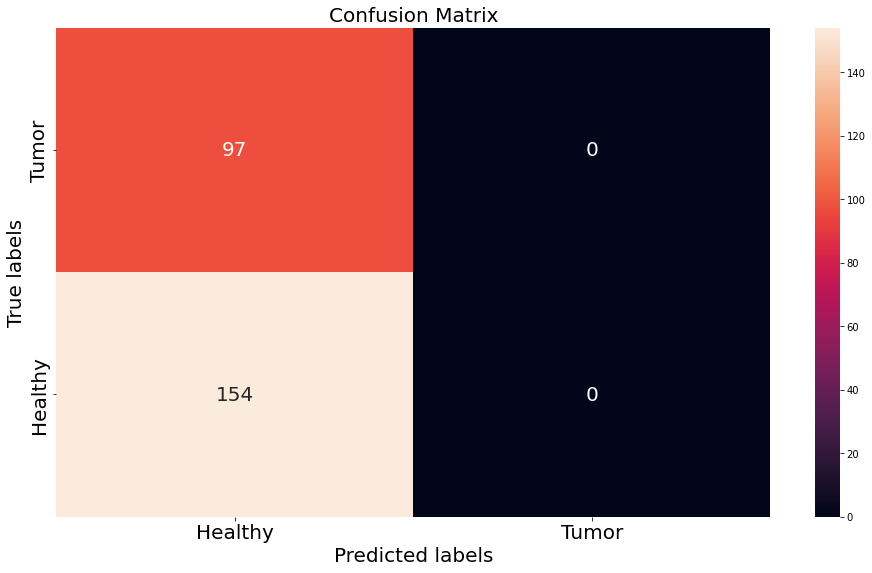

In [27]:
import seaborn as sns

plt.figure(figsize=(16,9))
cm = confusion_matrix(y_true, threshold(outputs))
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, annot_kws={"size": 20})

# labels, title and ticks
ax.set_xlabel('Predicted labels', fontsize=20)
ax.set_ylabel('True labels', fontsize=20) 
ax.set_title('Confusion Matrix', fontsize=20)
ax.xaxis.set_ticklabels(['Healthy','Tumor'], fontsize=20)
ax.yaxis.set_ticklabels(['Tumor','Healthy'], fontsize=20)
[(0, 0.5, 'Tumor'), (0, 1.5, 'Healthy')]


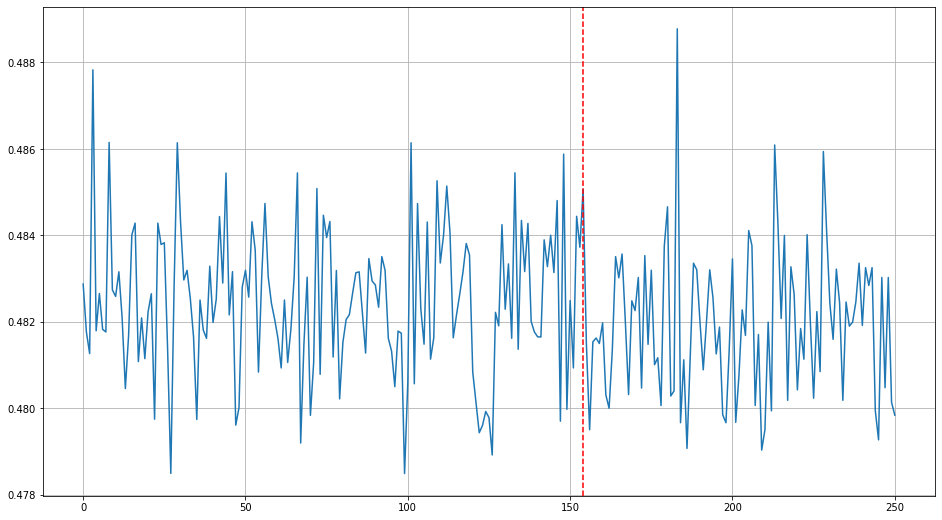

In [28]:
plt.figure(figsize=(16,9))
plt.plot(outputs)
plt.axvline(x=len(tumor), color='r', linestyle='--')
plt.grid()

#it give nothing informative really ^o^

# NOW WE TRAIN THIS DUMB MODEL ^-^

In [29]:
learning_rate = 0.0001
EPOCH = 400 
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) #dictates how you walk on the error surface on the hopes of finding the minimum
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=True)
model.train()


CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [30]:
# for every epoch, compute the errors across the entire EPOCH
for epoch in range(1, EPOCH):
    losses = []
    for data in dataloader:
        optimizer.zero_grad()  #reset it so it will not cache anything
        image = data["Image"].to(device)
        label = data["Label"].to(device)
        #compute the prediction of the model
        y_hat = model(image.float())
        #print(y_hat.squeeze().shape)
        #print(label.shape)
        #sys.exit()
        
        #define loss function
        error = nn.BCELoss()
        #compute the errors
        loss = torch.sum(error(y_hat.squeeze(), label))
        loss.backward()
        
        #update the parameters of the Model ( LEARNING )
        optimizer.step()
        
        losses.append(loss.item())
        
    #print the number of theepoch and it's loss , every 10 epochs (not for all)
    if(epoch+1)%10 == 0:
        print('Train Epoch: {}\tloss: {:.6f}'.format(epoch+1, np.mean(losses)))
        

/Users/lujeineabed/opt/anaconda3/envs/MRI/lib/python3.6/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Train Epoch: 10	loss: 0.625399
Train Epoch: 20	loss: 0.595983
Train Epoch: 30	loss: 0.547091
Train Epoch: 40	loss: 0.512473
Train Epoch: 50	loss: 0.487537
Train Epoch: 60	loss: 0.458119
Train Epoch: 70	loss: 0.437994
Train Epoch: 80	loss: 0.412343
Train Epoch: 90	loss: 0.402996
Train Epoch: 100	loss: 0.371461
Train Epoch: 110	loss: 0.352077
Train Epoch: 120	loss: 0.324533
Train Epoch: 130	loss: 0.314316
Train Epoch: 140	loss: 0.291396
Train Epoch: 150	loss: 0.280954
Train Epoch: 160	loss: 0.241811
Train Epoch: 170	loss: 0.224011
Train Epoch: 180	loss: 0.219691
Train Epoch: 190	loss: 0.203651
Train Epoch: 200	loss: 0.169351
Train Epoch: 210	loss: 0.154558
Train Epoch: 220	loss: 0.135034
Train Epoch: 230	loss: 0.121659
Train Epoch: 240	loss: 0.118389
Train Epoch: 250	loss: 0.096419
Train Epoch: 260	loss: 0.081344
Train Epoch: 270	loss: 0.067541
Train Epoch: 280	loss: 0.057196
Train Epoch: 290	loss: 0.049780
Train Epoch: 300	loss: 0.040294
Train Epoch: 310	loss: 0.035863
Train Epoch: 320	

## Evaluate the Smart Model

In [34]:
model.eval()
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=False)
outputs=[]
y_true = []
with torch.no_grad():
    for D in dataloader:
        image =  D['Image'].to(device)
        label = D['Label'].to(device)
        
        y_hat = model(image.float())
        
        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())
        
outputs = np.concatenate( outputs, axis=0 )
y_true = np.concatenate( y_true, axis=0 )

In [35]:
accuracy_score(y_true, threshold(outputs))

1.0

confusion matrix

[Text(0, 0.5, 'Tumor'), Text(0, 1.5, 'Healthy')]

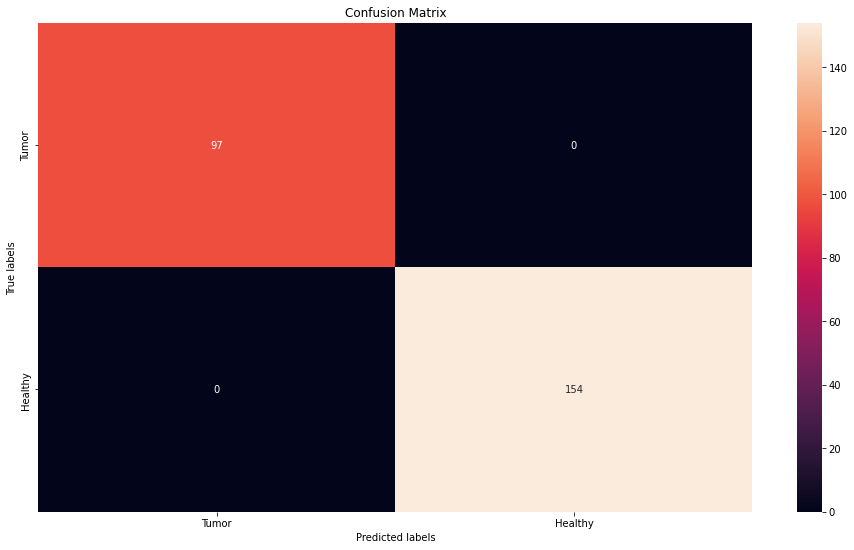

In [36]:
cm = confusion_matrix(y_true, threshold(outputs))
plt.figure(figsize=(16,9))

ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Tumor','Healthy'])
ax.yaxis.set_ticklabels(['Tumor','Healthy'])


## Visualising the Feature Maps of the Convolutional Filters

In [37]:
model

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [38]:
no_of_layers = 0
conv_layers = []

In [40]:
model_children = list(model.children())

In [43]:
for child in model_children:              #cnn_model
    if type(child) == nn.Sequential:
        for layer in child.children():      #conv2d,tanh,avgpool2d,...
            if type(layer) == nn.Conv2d:
                no_of_layers += 1
                conv_layers.append(layer)

In [57]:
conv_layers

[Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1)),
 Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))]

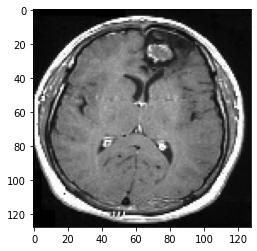

In [87]:
#show an image from the dataset
img = mri_dataset[100]['Image']
plt.imshow(img.reshape(128,128,3))

In [88]:
#put the image on the device
img = torch.from_numpy(img).to(device)

In [89]:
img.shape

torch.Size([3, 128, 128])

In [90]:
img = img.float().unsqueeze(0) #unhide the fourth dimension
img.shape


torch.Size([1, 3, 128, 128])

In [94]:
results = [conv_layers[0](img)] 
#results holds the feature maps
# conv_layers[0](img) : grabs the image, convolves all 6 filters against it
# and produces 6 feature maps

# here we only have one more layer to add but the loop is how it's generally done
for i in range(1, len(conv_layers)):
    results.append(conv_layers[i](results[-1]))   #the very last output of the previous layer(here current last in results list) is the input to the next
    
outputs = results  
    

In [98]:
outputs[0].shape

torch.Size([1, 6, 124, 124])

Layer 1


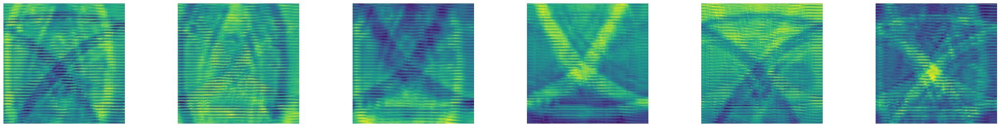

Layer 2


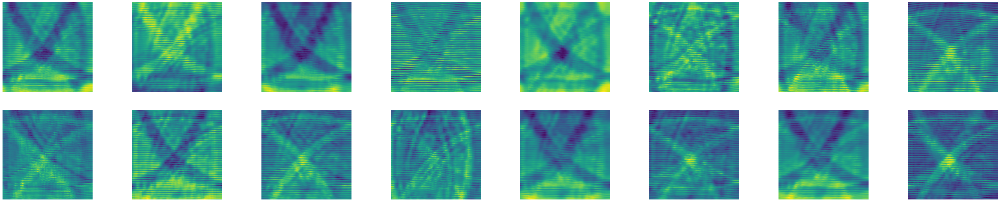

In [100]:
for num_layer in range(len(outputs)):
    plt.figure(figsize=(50, 10))
    layer_viz = outputs[num_layer].squeeze()
    print(f"Layer {num_layer+1}")
    for i, f in enumerate(layer_viz):
        plt.subplot(2, 8, i + 1)
        plt.imshow(f.detach().cpu().numpy())
        plt.axis("off")
    plt.show()
    plt.close()